# Removing clouds in Landsat images

## Searching for Landsat scenes

In [1]:
!pip install landsatxplore

Defaulting to user installation because normal site-packages is not writeable
  Using cached landsatxplore-0.15.0-py3-none-any.whl.metadata (7.9 kB)
  Using cached click-7.1.2-py2.py3-none-any.whl.metadata (2.9 kB)
  Using cached requests-2.31.0-py3-none-any.whl.metadata (4.6 kB)
     ---------------------------------------- 0.0/43.1 kB ? eta -:--:--
     --------- ------------------------------ 10.2/43.1 kB ? eta -:--:--
     ------------------ ------------------- 20.5/43.1 kB 217.9 kB/s eta 0:00:01
     ------------------------------------ - 41.0/43.1 kB 281.8 kB/s eta 0:00:01
     -------------------------------------- 43.1/43.1 kB 233.2 kB/s eta 0:00:00
     ---------------------------------------- 0.0/57.6 kB ? eta -:--:--
     --------------------- ------------------ 30.7/57.6 kB ? eta -:--:--
     ---------------------------------------- 57.6/57.6 kB 1.0 MB/s eta 0:00:00
   ---------------------------------------- 0.0/82.8 kB ? eta -:--:--
   ------------------------------------

In [2]:
from landsatxplore.api import API
import os

# Your USGS  credentials
username = os.environ.get('arelyayalaa5')
password = os.environ.get('DatosTesis500.')

# Initialize a new API instance
api = API('arelyayalaa5', 'DatosTesis500.')

# Search for Landsat TM scenes
scenes = api.search(
    dataset='landsat_ot_c2_l2',
    latitude=20.2622,
    longitude=-103.0463,
    start_date='2020-01-01',
    end_date='2023-12-31',
    max_cloud_cover=50
)

# log out
api.logout()

In [4]:
import pandas as pd

# Create a DataFrame from the scenes
df_scenes = pd.DataFrame(scenes)
df_scenes = df_scenes[['display_id','wrs_path', 'wrs_row','satellite','cloud_cover','acquisition_date']]
df_scenes.sort_values('acquisition_date', ascending=False, inplace=True)
df_scenes

,display_id,wrs_path,wrs_row,satellite,cloud_cover,acquisition_date
0,LC08_L2SP_029046_20231231_20240109_02_T1,29,46,8,4,2023-12-31
1,LC08_L2SP_029046_20231215_20240102_02_T1,29,46,8,5,2023-12-15
2,LC09_L2SP_029046_20231121_20231122_02_T1,29,46,9,33,2023-11-21
3,LC08_L2SP_029046_20231113_20231121_02_T1,29,46,8,10,2023-11-13
4,LC09_L2SP_029046_20231105_20231106_02_T1,29,46,9,1,2023-11-05
...,...,...,...,...,...,...
95,LC08_L2SP_029046_20210413_20210423_02_T1,29,46,8,1,2021-04-13
96,LC08_L2SP_029046_20210328_20210402_02_T1,29,46,8,2,2021-03-28
97,LC08_L2SP_029046_20210312_20210317_02_T1,29,46,8,0,2021-03-12
98,LC08_L2SP_029046_20210224_20210304_02_T1,29,46,8,1,2021-02-24


In [ ]:
# import pandas as pd

# Create DataFrame from the scenes
# df_scenes = pd.DataFrame(scenes)
# df_scenes = df_scenes[['display_id','wrs_path', 'wrs_row','satellite','cloud_cover','acquisition_date']]
#df_scenes = df_scenes[df_scenes.wrs_row == 83]
# df_scenes.sort_values('acquisition_date', ascending=False, inplace=True)

# Print the first 5 scenes
# print(len(df_scenes)) #value: 55
#df_scenes.to_clipboard()
# df_scenes.head()


In [5]:
from landsatxplore.earthexplorer import EarthExplorer
import os

def get_scene(ID):

    # Initialize the API
    username = os.environ.get('arelyayalaa5')
    password = os.environ.get('DatosTesis500.')
    ee = EarthExplorer('arelyayalaa5', 'DatosTesis500.')

    # Download the scene
    try:
        ee.download(ID, output_dir='./data')
        print('{} succesful'.format(ID))

    # Additional error handling
    except:
        if os.path.isfile('./data/{}.tar'.format(ID)):
            print('{} error but file exists'.format(ID))
        else:
            print('{} error'.format(ID))

    ee.logout()

get_scene('LC08_L2SP_029046_20220227_20220309_02_T1') # Nubes
get_scene('LC08_L2SP_029046_20220211_20220222_02_T1') # No nubes

Download failed with dataset id 1 of 3. Re-trying with the next one.


1.00GB [01:49, 9.75MB/s]                            


None of the archived ids succeeded! Update necessary!
LC08_L2SP_029046_20220227_20220309_02_T1 error but file exists
Download failed with dataset id 1 of 3. Re-trying with the next one.


970MB [01:44, 9.72MB/s]                            


None of the archived ids succeeded! Update necessary!
LC08_L2SP_029046_20220211_20220222_02_T1 error but file exists


In [6]:
import tarfile

IDs = ['LC08_L2SP_029046_20220227_20220309_02_T1', # Nubes
       'LC08_L2SP_029046_20220211_20220222_02_T1'] # No nubes

for ID in IDs:
    # Extract files from tar archive
    tar = tarfile.open('./data/{}.tar'.format(ID))
    tar.extractall('./data/{}'.format(ID))
    tar.close()


## Visualize the Landsat scenes

In [9]:
import tifffile as tiff
import numpy as np
import matplotlib.pyplot as plt

def get_RGB(ID):

    # Load Blue (B2), Green (B3) and Red (B4) bands
    B2 = tiff.imread('./data/{}/{}_SR_B2.TIF'.format(ID, ID))
    B3 = tiff.imread('./data/{}/{}_SR_B3.TIF'.format(ID, ID))
    B4 = tiff.imread('./data/{}/{}_SR_B4.TIF'.format(ID, ID))

    # Stack and scale bands
    RGB = np.dstack((B4, B3, B2))
    RGB = np.clip(RGB*0.0000275-0.2, 0, 1)

    # Clip to enhance contrast
    RGB = np.clip(RGB,0,0.3)/0.3

    return RGB

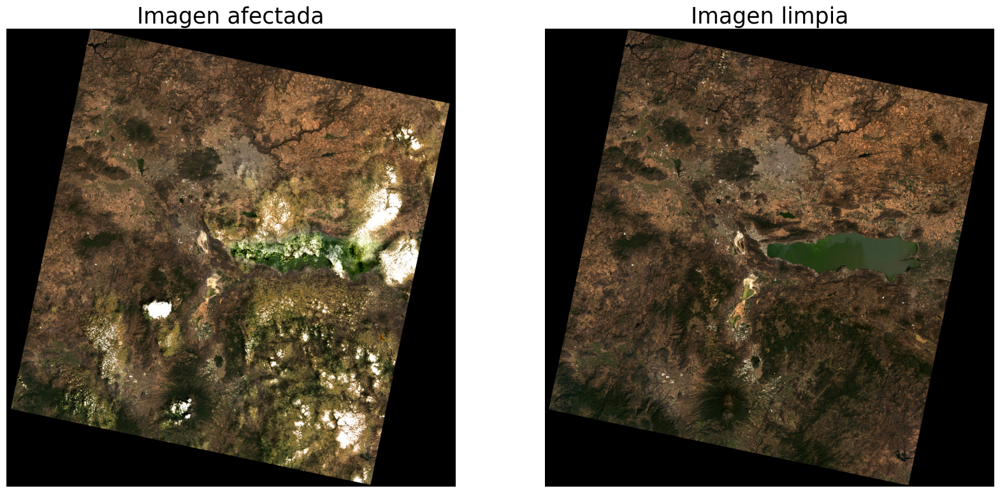

In [11]:
IDs = ['LC08_L2SP_029046_20220227_20220309_02_T1', # Nubes
       'LC08_L2SP_029046_20220211_20220222_02_T1'] # No nubes

fig, ax = plt.subplots(1,2,figsize=(20, 10))

# Cloudy image
ID = IDs[0]
RGB = get_RGB(ID)
ax[0].imshow(RGB)
ax[0].set_title('Imagen afectada',size=25)
ax[0].set_axis_off()

# Non-cloudy image
ID = IDs[1]
RGB = get_RGB(ID)
ax[1].imshow(RGB)
ax[1].set_title('Imagen limpia',size=25)
ax[1].set_axis_off()

plt.savefig("1.jpg", bbox_inches='tight')

# Get cloud masks

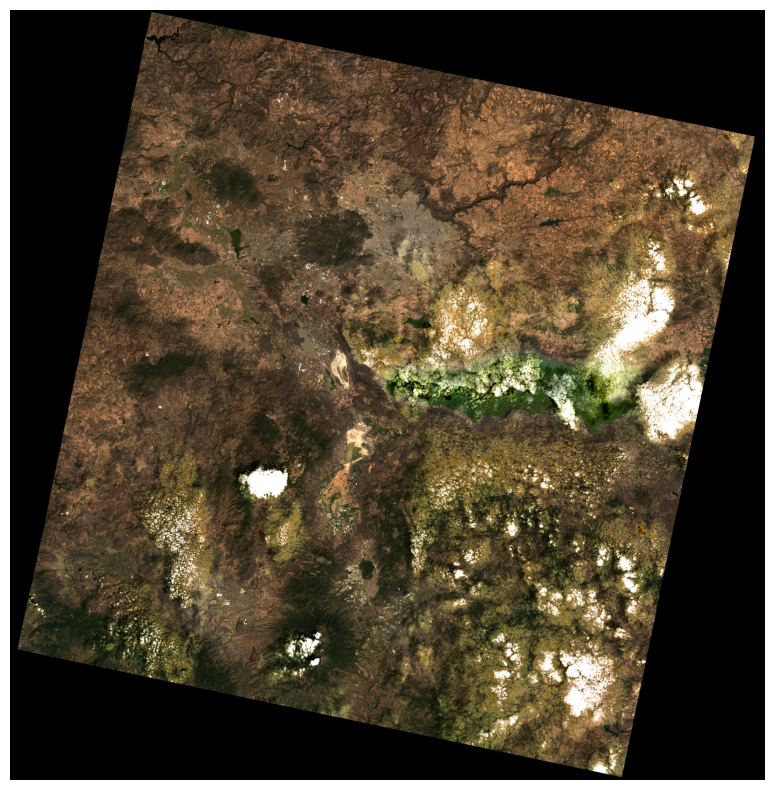

In [12]:
ID = 'LC08_L2SP_029046_20220227_20220309_02_T1' # Nubes
RGB = get_RGB(ID)

# Plot the RGB image
fig, ax = plt.subplots(figsize=(20, 10))
ax.imshow(RGB)
ax.set_axis_off()

### Provided by landsat

In [13]:
def get_mask(val,type='cloud'):

    """Get mask for a specific cover type"""

    # convert to binary
    bin_ = '{0:016b}'.format(val)

    # reverse string
    str_bin = str(bin_)[::-1]

    # get bit for cover type
    bits = {'cloud':3,'shadow':4,'dilated_cloud':1,'cirrus':2}
    bit = str_bin[bits[type]]

    if bit == '1':
        return 0 # cover
    else:
        return 1 # no cover

In [14]:
# QA band
QA = tiff.imread('./data/{}/{}_QA_PIXEL.TIF'.format(ID, ID))
QA = np.array(QA)

# Get masks
cloud_mask = np.vectorize(get_mask)(QA,type='cloud')
shadow_mask = np.vectorize(get_mask)(QA,type='shadow')
dilated_cloud_mask = np.vectorize(get_mask)(QA,type='dilated_cloud')
cirrus_mask = np.vectorize(get_mask)(QA,type='cirrus')

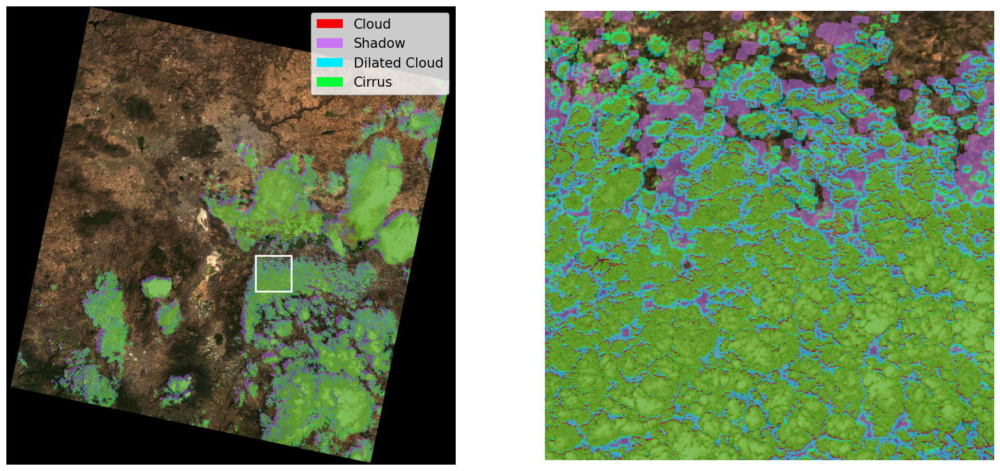

In [16]:
import cv2
import matplotlib as mpl

# Get RGB image
ID = "LC08_L2SP_029046_20220227_20220309_02_T1" # Nubes
RGB = get_RGB(ID)

# segmentation image
seg = RGB.copy()

# color for each cover type
colors = np.array([[247, 2, 7],
                    [201, 116, 247],
                    [0, 234, 255],
                    [3, 252, 53]])/255

masks = [cloud_mask, shadow_mask, dilated_cloud_mask, cirrus_mask]

for i,mask in enumerate(masks):

    # color for cover type
    temp = seg.copy()
    temp[mask == 0] = colors[i]

    # add to segmentation
    seg = cv2.addWeighted(seg, 0.5, temp, 0.5, 0)

fig, ax = plt.subplots(1,2,figsize=(20, 10))

ax[0].imshow(seg)

# add legend with colors for each cover type
legend_elements = [mpl.patches.Patch(facecolor=colors[0], label='Cloud'),
                     mpl.patches.Patch(facecolor=colors[1], label='Shadow'),
                        mpl.patches.Patch(facecolor=colors[2], label='Dilated Cloud'),
                        mpl.patches.Patch(facecolor=colors[3], label='Cirrus')]

ax[0].legend(handles=legend_elements, loc='upper right', fontsize=15)

# draw white rectangle around area of interest
h = 300
x,y = 4500,4500
rect = mpl.patches.Rectangle((x-h,y-h),h*2,h*2,linewidth=2,edgecolor='w',facecolor='none')
ax[0].add_patch(rect)

# crop area of interest
crop_seg =  seg[y-h:y+h,x-h:x+h,:]

ax[1].imshow(crop_seg)

ax[0].set_axis_off()
ax[1].set_axis_off()

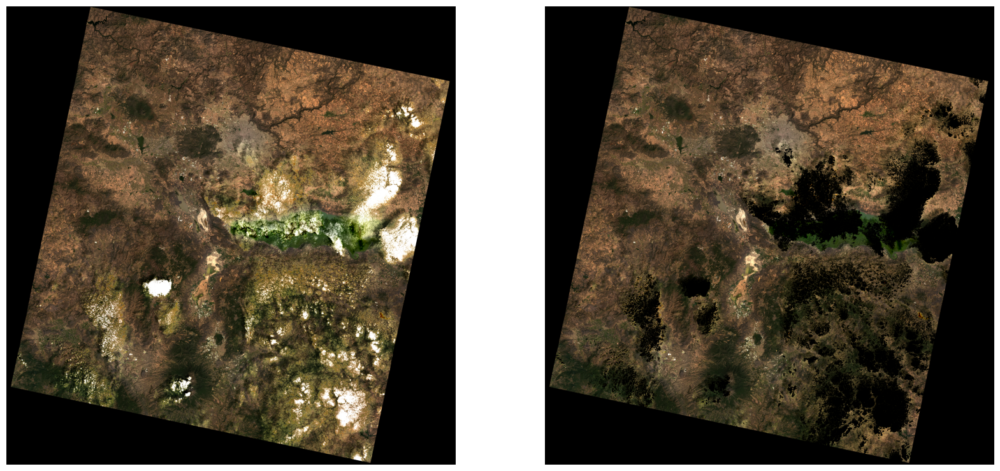

In [17]:
# Remove clouds
rm_clouds = RGB*cloud_mask[:, :, np.newaxis]

# Plot RGB and RGB without clouds
fig, ax = plt.subplots(1,2,figsize=(20, 10))

ax[0].imshow(RGB)
ax[1].imshow(rm_clouds)

ax[0].set_axis_off()
ax[1].set_axis_off()

In [18]:
# crop area of interest
cloud_aoi = cloud_mask[y-h:y+h,x-h:x+h]

# calculate percentage of cloud cover
per_cloud = np.average(1-cloud_aoi)*100
print('Percentage of clouds: {:.2f}%'.format(per_cloud))


Percentage of clouds: 54.54%


### Machine Learning Approach


In [19]:
def cloud_pred(B1,B4,B7):
    """Cloud prediction model"""

    pred = 2.16246741593412 -0.796409165054949*B4 + \
    0.971776520302587*np.sqrt(abs(0.028702220187686*B7*B1 + \
    0.971297779812314*np.sin(B1))) + \
    0.0235599298084993*np.floor(0.995223926146334*np.sqrt(abs(0.028702220187686*B7*B1 + 0.971297779812314*np.sin(B1)))+ \
    0.00477607385366598*abs(0.028702220187686*B7*B1 + \
    0.971297779812314*np.sin(B1))) - 0.180030905136552*np.cos(B4) + \
    0.0046635498889134*abs(0.028702220187686*B7*B1 + 0.971297779812314*np.sin(B1))

    cloud = np.where(pred > B7,0,1)

    return cloud

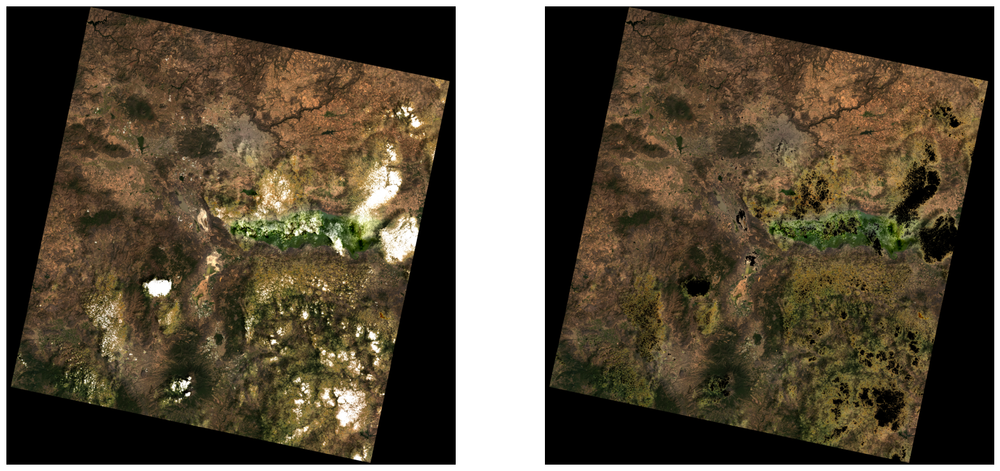

In [20]:
ID = "LC08_L2SP_029046_20220227_20220309_02_T1" # Nubes

# Get Coastal Aerosol (B1), Red (B4) and Shortwave Infrared 2 (B7) bands
B1 = tiff.imread('./data/{}/{}_SR_B1.TIF'.format(ID, ID))
B4 = tiff.imread('./data/{}/{}_SR_B4.TIF'.format(ID, ID))
B7 = tiff.imread('./data/{}/{}_SR_B7.TIF'.format(ID, ID))

# Get cloud mask
cloud_mask_2 = cloud_pred(B1,B4,B7)

# Remove clouds
rm_clouds = RGB*cloud_mask_2[:, :, np.newaxis]

# Plot RGB and RGB without clouds
fig, ax = plt.subplots(1,2,figsize=(20, 10))

ax[0].imshow(RGB)
ax[1].imshow(rm_clouds)

ax[0].set_axis_off()
ax[1].set_axis_off()

# Inpainting clouds

## Area of interest

In [22]:
import rasterio as rio

# IDs for cloudy and non-cloudy images
IDs = ['LC08_L2SP_029046_20220227_20220309_02_T1', # Nubes
       'LC08_L2SP_029046_20220211_20220222_02_T1'] # No nubes

# Get RGB
cloudy = get_RGB(IDs[0])
clear = get_RGB(IDs[1])

# Open red band with rasterio for geolocation
geo_cloudy = rio.open('./data/{}/{}_SR_B4.TIF'.format(IDs[0], IDs[0]))
geo_clear = rio.open('./data/{}/{}_SR_B4.TIF'.format(IDs[1], IDs[1]))

print("Bounding box of cloudy image: {}".format(geo_cloudy.bounds))
print("Bounding box of non-cloudy image: {}".format(geo_clear.bounds))

Bounding box of cloudy image: BoundingBox(left=551685.0, bottom=2121285.0, right=778515.0, top=2352915.0)
Bounding box of non-cloudy image: BoundingBox(left=552585.0, bottom=2121585.0, right=779415.0, top=2352915.0)


In [23]:
# get mask for cloudy image
mask = cloud_mask*shadow_mask*dilated_cloud_mask*cirrus_mask

# remove cloudy pixels
rm_mask = cloudy*mask[:, :, np.newaxis]

#crop area of interest
x,y,h = 4500,4500,300
crop_rm_mask = rm_mask[y-h:y+h,x-h:x+h]


In [24]:
# get UTM coordinates from cloudy image
utmx, utmy = geo_cloudy.xy(y,x)

# get pixels from clear image
y_,x_ = geo_clear.index(utmx, utmy)
print(x_,y_)

4470 4500


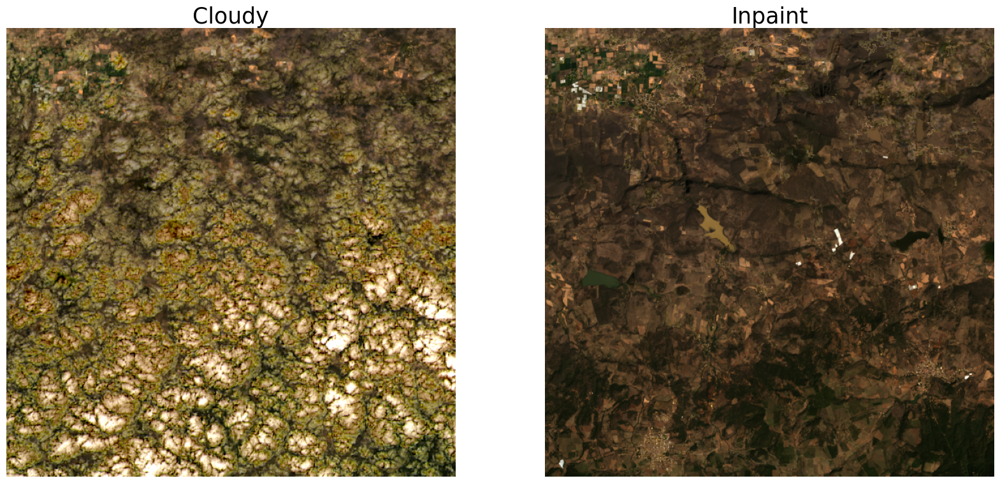

In [25]:
# crop clear image
crop_clear = clear[y_-h:y_+h,x_-h:x_+h]

#get fill from clear image
crop_mask = mask[y-h:y+h,x-h:x+h]
fill = crop_clear*(1-crop_mask[:, :, np.newaxis])

#inpaint area of interest
inpaint = crop_rm_mask + fill

#display
fig, ax = plt.subplots(1,2,figsize=(20, 10))

# Cloudy image
ax[0].imshow(cloudy[y-h:y+h,x-h:x+h])
ax[0].set_title('Cloudy',size=25)
ax[0].set_axis_off()

# Non-cloudy image
ax[1].imshow(inpaint)
ax[1].set_title('Inpaint',size=25)
ax[1].set_axis_off()

## The entire image

In [26]:
print("Bounding box of cloudy image: {}".format(geo_cloudy.bounds))
print("Bounding box of non-cloudy image: {}".format(geo_clear.bounds))

Bounding box of cloudy image: BoundingBox(left=551685.0, bottom=2121285.0, right=778515.0, top=2352915.0)
Bounding box of non-cloudy image: BoundingBox(left=552585.0, bottom=2121585.0, right=779415.0, top=2352915.0)


In [27]:
# get pixel coordinates of non-cloudy image
y,x = geo_clear.read(1).shape
clear_ul = (0,0) # upper left
clear_lr = (y,x) # lower right

print(clear_ul, clear_lr)

# get pixel coordinates of cloudy image corners
cloudy_bounds = geo_cloudy.bounds
new_clear_ul = geo_clear.index(cloudy_bounds.left,cloudy_bounds.top)
new_clear_lr = geo_clear.index(cloudy_bounds.right,cloudy_bounds.bottom)

print(new_clear_ul, new_clear_lr)

# calculate pixel adjustment
top_adj = clear_ul[0] - new_clear_ul[0]
bottom_adj = new_clear_lr[0] - clear_lr[0]

left_adj = clear_ul[1] -  new_clear_ul[1]
right_adj = new_clear_lr[1] - clear_lr[1]

print(top_adj, bottom_adj, left_adj, right_adj)

(0, 0) (7711, 7561)
(0, -30) (7721, 7531)
0 10 30 -30


In [42]:
def adjust_rgb(rgb, top_adj, bottom_adj, left_adj, right_adj):
    # Añadiendo píxeles negros
    if top_adj > 0:
        add_top = np.zeros((top_adj, rgb.shape[1], 3), dtype=rgb.dtype)
        rgb = np.vstack((add_top, rgb))
    if bottom_adj > 0:
        add_bottom = np.zeros((bottom_adj, rgb.shape[1], 3), dtype=rgb.dtype)
        rgb = np.vstack((rgb, add_bottom))

    # Ajustando el lado izquierdo y derecho
    if left_adj > 0:
        add_left = np.zeros((rgb.shape[0], left_adj, 3), dtype=rgb.dtype)
        rgb = np.hstack((add_left, rgb))
    if right_adj < 0:
        rgb = rgb[:, :right_adj, :]
    elif right_adj > 0:
        add_right = np.zeros((rgb.shape[0], right_adj, 3), dtype=rgb.dtype)
        rgb = np.hstack((rgb, add_right))

    # Quitando píxeles
    if top_adj < 0:
        rgb = rgb[-top_adj:, :, :]
    if bottom_adj < 0:
        rgb = rgb[:bottom_adj, :, :]
    if left_adj < 0:
        rgb = rgb[:, -left_adj:, :]

    return rgb


In [49]:
# Get RGB images
cloudy_RGB = get_RGB(IDs[0])
clear_RGB = get_RGB(IDs[1])

# Adjust clear RGB image
clear_RGB_adj = adjust_rgb(clear_RGB,top_adj, bottom_adj, left_adj, right_adj)

# get mask for cloudy image
mask = cloud_mask*shadow_mask*dilated_cloud_mask*cirrus_mask

# remove cloudy pixels and fill with adjusted clear pixels
rm_mask = cloudy_RGB*mask[:, :, np.newaxis]
fill_mask = clear_RGB_adj*(1-mask[:, :, np.newaxis])
inpaint = rm_mask+fill_mask

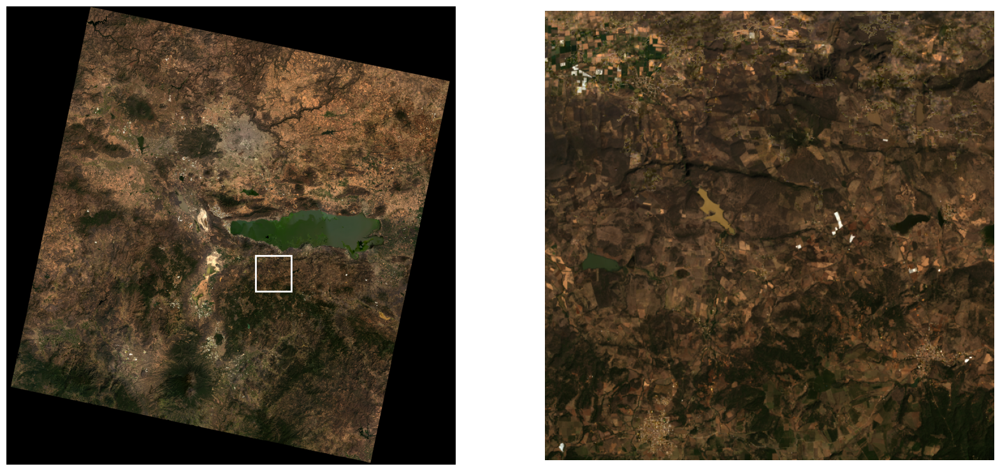

In [50]:
# Plot RGB and RGB without clouds
fig, ax = plt.subplots(1,2,figsize=(20, 10))
ax[0].imshow(inpaint)

# draw white rectangle around area of interest
h = 300
x,y = 4500,4500
rect = mpl.patches.Rectangle((x-h,y-h),h*2,h*2,linewidth=2,edgecolor='w',facecolor='none')
ax[0].add_patch(rect)

# crop area of interest
crop_inpaint =  inpaint[y-h:y+h,x-h:x+h,:]
ax[1].imshow(crop_inpaint)

ax[0].set_axis_off()
ax[1].set_axis_off()
plt.savefig("6.jpg", bbox_inches='tight')

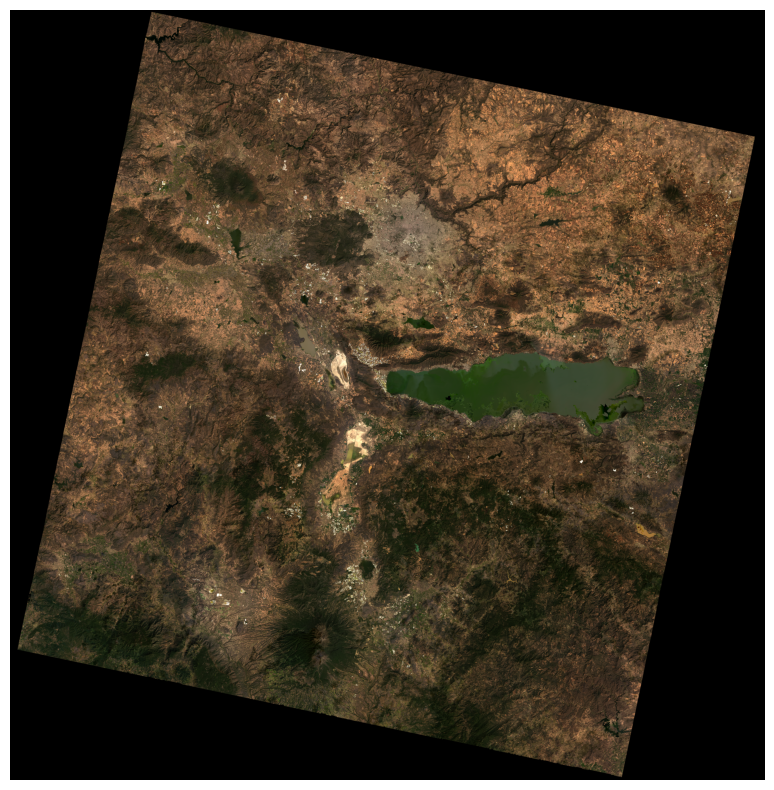

In [55]:
# Plot RGB and RGB without clouds
fig, ax = plt.subplots(figsize=(20, 10))
ax.imshow(inpaint)
ax.set_axis_off()

plt.savefig("Inpainting_Final.jpg", bbox_inches='tight')

Text(0.5, 1.0, 'Imagen con Inpainting')

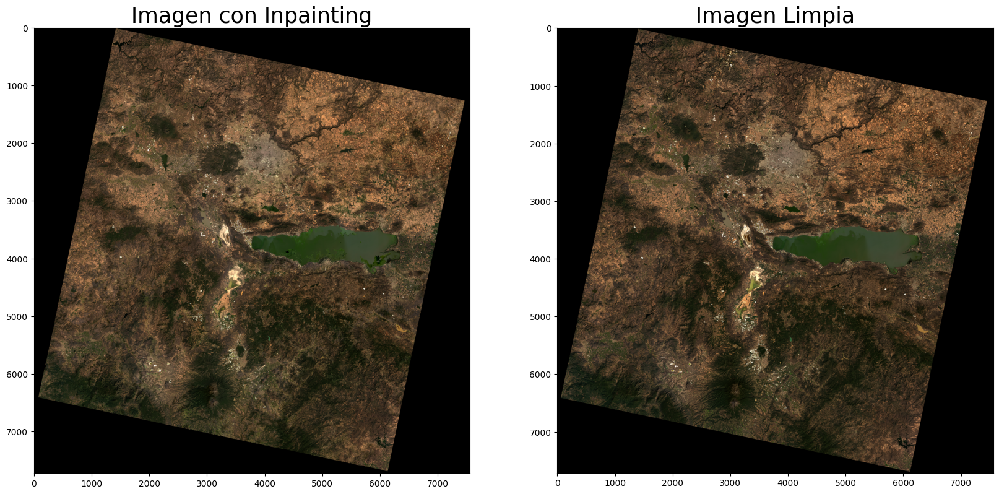

In [59]:
fig, ax = plt.subplots(1, 2, figsize=(20, 10))

# Non-cloudy image
ID = IDs[1]
RGB = get_RGB(ID)
ax[1].imshow(RGB)
ax[1].set_title('Imagen Limpia',size=25)

# Plot RGB and RGB without clouds
ax[0].imshow(inpaint)
ax[0].set_title('Imagen con Inpainting', size=25)